# This notebook plot annual & seaonal mean MCS rain statistics on maps
## The monthly data is produced by: 
* PyFLEXTRKR-dev/Analysis/calc_tbpf_mcs_monthly_rainmap_healpix.py

In [117]:
import numpy as np
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
# import colorcet as cc
import copy, os
import colormaps as cmaps
import easygems.healpix as egh

In [132]:
rootdir = '/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/'
name_map = {
    'obs': 'IMERGv7',
    'm1': 'cess1',
    'm2': 'cess2',
}
name_map_plot = {
    'obs': 'OBS',
    'm1': 'Cess1',
    'm2': 'Cess2',
}

# Input filenames
# filenames = {key:f'{rootdir}{value}_monthly_rainmap_cof_hp8_v1.nc' for key,value in name_map.items()}
rootdir1 = '/pscratch/sd/w/wcmca1/hackathon/mcs/'
rootdir2 = '/pscratch/sd/w/wcmca1/SCREAMv1-cess2/mcs/'
# /pscratch/sd/w/wcmca1/hackathon/mcs/IMERGv7/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc
# /pscratch/sd/w/wcmca1/hackathon/mcs/scream/stats/monthly/mcs_monthly_rainmap_hp9_20190801_20200831.nc
# /pscratch/sd/w/wcmca1/SCREAMv1-cess2/mcs/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20210228.nc
filenames = {
    'obs': f'{rootdir1}IMERGv7/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc',
    'm1': f'{rootdir1}scream/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc',
    'm2': f'{rootdir2}stats/monthly/mcs_monthly_rainmap_hp8.nc',
}

# Analysis period
start_date = '2019-09-01'
end_date = '2020-08-31'

landmaskfile = '/global/cfs/cdirs/m4581/gsharing/hackathon/scream-cess-healpix/scream2D_hrly_topo_hp8_v7.zarr'

figdir = '/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess2/global/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/E3SM/SCREAMv1/cess2/global/


### Check if input files exist

In [133]:
for key, value in filenames.items():
    print(f'{value}: {os.path.isfile(value)}')

/pscratch/sd/w/wcmca1/hackathon/mcs/IMERGv7/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc: True
/pscratch/sd/w/wcmca1/hackathon/mcs/scream/stats/monthly/mcs_monthly_rainmap_hp8_20190801_20200831.nc: True
/pscratch/sd/w/wcmca1/SCREAMv1-cess2/mcs/stats/monthly/mcs_monthly_rainmap_hp8.nc: True


In [134]:
# Read topography and land fraction data
dstop = xr.open_dataset(landmaskfile)
ter = dstop.ELEV
landfrac = dstop.LANDFRAC
lon_ter = dstop.lon.load()
lat_ter = dstop.lat.load()
dstop

<xarray.Dataset> Size: 13MB
Dimensions:   (cell: 786432, crs: 0)
Coordinates:
  * crs       (crs) float64 0B 
Dimensions without coordinates: cell
Data variables:
    ELEV      (cell) float32 3MB ...
    LANDFRAC  (cell) float32 3MB ...
    lat       (cell) float32 3MB 0.1492 0.2984 0.2984 ... -0.2984 -0.1492
    lon       (cell) float32 3MB 45.02 45.2 44.85 45.02 ... 315.2 314.8 315.0
Attributes:
    NCO:                        netCDF Operators version 4.9.8-alpha01 (Homep...
    history:                    Fri Jun 11 12:26:48 2021: ncks -A USGS-gtopo3...
    history_of_appended_files:  Fri Jun 11 12:26:48 2021: Appended file USGS-...
    source:                     USGS 30-sec dataset binned to ncube3000 (cube...
    title:                      30-second USGS topo data

<Figure size 640x480 with 0 Axes>

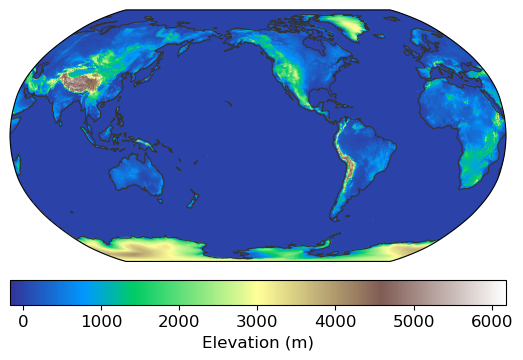

In [135]:
im = egh.healpix_show(ter, cmap='terrain')
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Elevation (m)')

<Figure size 640x480 with 0 Axes>

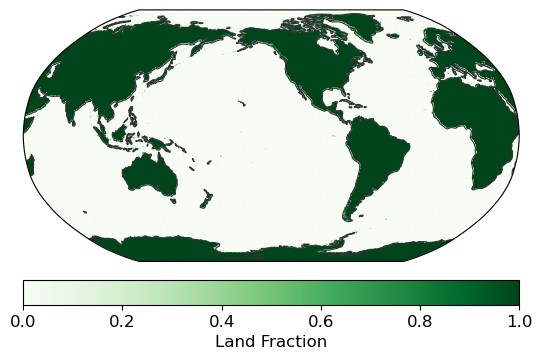

In [136]:
im = egh.healpix_show(landfrac, cmap='Greens', vmin=0, vmax=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Land Fraction')

## Read and combine all sources to a single DataSet

In [137]:
drop_vars = []
# Read all files and combine them with a new dimension 'source'
ds = xr.open_mfdataset(list(filenames.values()), combine='nested', concat_dim='source', drop_variables=drop_vars).squeeze()
# Assign new coordinate 'source' using name_map dictionary keys
ds['source'] = list(name_map.keys())

# Select analysis period
ds = ds.sel(time=slice(start_date, end_date))

# ds = ds.pipe(egh.attach_coords)
# Load lat/lon coordinates in memory
hp_lat = ds.lat.load()
hp_lon = ds.lon.load()
ds

<xarray.Dataset> Size: 494MB
Dimensions:                  (source: 3, time: 12, cell: 786432)
Coordinates:
  * time                     (time) datetime64[ns] 96B 2019-09-01 ... 2020-08-01
  * cell                     (cell) int32 3MB 0 1 2 3 ... 786429 786430 786431
    lat                      (source, cell) float64 19MB 89.82 89.82 ... -0.1492
    lon                      (source, cell) float64 19MB 45.0 135.0 ... 315.0
    crs                      int64 8B 0
  * source                   (source) <U3 36B 'obs' 'm1' 'm2'
Data variables:
    precipitation            (source, time, cell) float32 113MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_precipitation        (source, time, cell) float32 113MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_precipitation_count  (source, time, cell) float32 113MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_cloud_count          (source, time, cell) float32 113MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ntimes                   (source, time) float32 144B dask.array<chunksize=(1, 1), meta=np.ndarray>
Attributes:
    Title:                    Monthly MCS precipitation statistics
    contact:                  Zhe Feng, zhe.feng@pnnl.gov
    created_on:               Thu Oct  9 11:58:41 2025
    grid_type:                HEALPix
    zoom_level:               8
    time_interval:            1.0
    precipitation_threshold:  2.0

In [138]:
ds.ntimes.sum(dim='time').values

array([8781., 8712., 8760.], dtype=float32)

In [139]:
# Get time interval from attributes
time_interval = float(ds.attrs['time_interval'])

# Calculate total hours in the year
ntimes_annual = ds.ntimes.sum(dim='time')
nhours_annual = ntimes_annual * time_interval

# Sum annual precipitation amount [mm], divided by total hours to get mm/day
tot_pcp_annual = ds.precipitation.sum(dim='time').compute() * 24 / nhours_annual
mcs_pcp_annual = ds.mcs_precipitation.sum(dim='time').compute() * 24 / nhours_annual
# Calculate MCS precipitation fraction
mcs_pcpfrac_annual = (mcs_pcp_annual / tot_pcp_annual * 100).where(tot_pcp_annual > 0).compute()
# Calculate MCS cloud and precipitation frequency [%]
mcs_cloudfreq_annual = (ds.mcs_cloud_count.sum(dim='time').compute() / nhours_annual * 100).where(nhours_annual > 0)
mcs_pcpfreq_annual = (ds.mcs_precipitation_count.sum(dim='time').compute() / nhours_annual * 100).where(nhours_annual > 0)

In [140]:
# Get time interval from attributes
time_interval = float(ds.attrs['time_interval'])

# Group by season and compute seasonal means
# Group dataset by season
ds_season = ds.groupby('time.season')

# Calculate total hours for each season
ntimes_season = ds_season.map(lambda x: x.ntimes.sum(dim='time'))
nhours_season = ntimes_season * time_interval
# nhours_season.values

# Sum seasonal precipitation amount [mm], divided by total hours to get mm/day
tot_pcp_season = ds_season.map(lambda x: 24. * x.precipitation.sum(dim='time')).compute() / nhours_season
mcs_pcp_season = ds_season.map(lambda x: 24. * x.mcs_precipitation.sum(dim='time')).compute() / nhours_season
# Calculate MCS precipitation fraction
mcs_pcpfrac_season = 100. * mcs_pcp_season / tot_pcp_season.where(tot_pcp_season > 0).compute()
# Calculate MCS cloud and precipitation frequency [%]
mcs_cloudfreq_season = ds_season.map(lambda x: 100 * x.mcs_cloud_count.mean(dim='time')).compute() / nhours_season
mcs_pcpfreq_season = ds_season.map(lambda x: 100 * x.mcs_precipitation_count.mean(dim='time')).compute() / nhours_season

<Figure size 640x480 with 0 Axes>

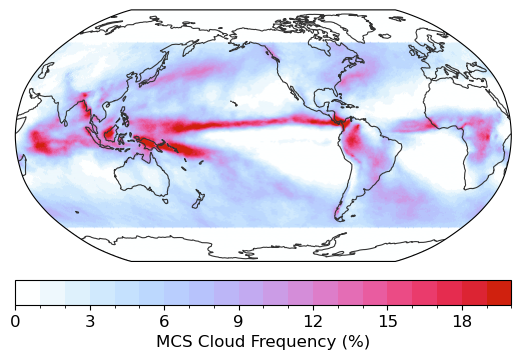

In [141]:
VAR = mcs_cloudfreq_annual.sel(source='m2')

colormaps = cmaps.cet_l_wcmr
levels = np.arange(0, 20.1, 1)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(VAR, cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS Cloud Frequency (%)')

<Figure size 640x480 with 0 Axes>

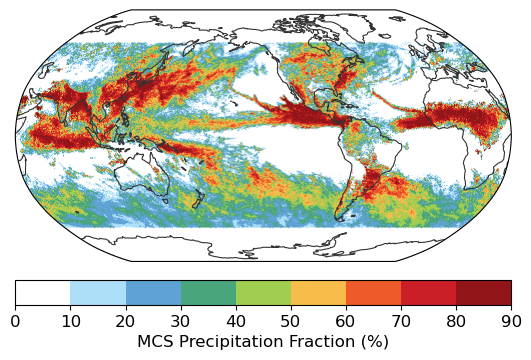

In [142]:
season = 'JJA'
# VAR = mcs_pcpfrac_season.sel(source='obs', season=season)
VAR = mcs_pcpfrac_season.sel(source='m2', season=season)

colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 90.1, 10)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(VAR, cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS Precipitation Fraction (%)')

## Function to make N x M maps (with colorbar for each panel)

In [ ]:
def plot_nxm_maps(nrow, ncol, data_arrays, hp_lon, hp_lat,
                  projection=None, central_lon=225, lat_range=None,
                  titles=None, levels=None, colormaps=None, cblabels=None, cbticks=None,
                  min_thresh=None, oob_colors=None,
                  wspace=None, hspace=None, figsize=None, fontsize=None, 
                  figtitle=None, figname=None, dpi=200):
    """
    Plot N x M maps with Cartopy projection and optional latitude clipping.
    
    Parameters:
    -----------
    nrow, ncol : int
        Number of rows and columns
    data_arrays : list of lists
        2D list of xarray DataArrays [nrow][ncol]
    hp_lon, hp_lat : arrays
        HEALPix longitude and latitude coordinates
    projection : cartopy projection
        Default: Robinson with central_lon
    central_lon : float
        Central longitude for projection (default: 225)
    lat_range : tuple
        (lat_min, lat_max) to clip display, e.g., (-60, 60)
    titles : list of lists
        2D list of subplot titles [nrow][ncol]
    levels : list or list of lists
        Contour levels (can be same for all or different per panel)
    colormaps : colormap or list of lists
        Colormap(s) to use
    cblabels : str or list of lists
        Colorbar label(s)
    cbticks : list or list of lists
        Colorbar tick locations
    min_thresh : float
        Minimum threshold to mask data
    oob_colors : dict
        Out-of-bounds colors {'over': color, 'under': color}
    wspace, hspace : float
        Spacing between subplots
    figsize : tuple
        Figure size (width, height)
    fontsize : int
        Font size for labels
    figtitle : str
        Overall figure title
    figname : str
        Output filename
    dpi : int
        DPI for saved figure
    """
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists
                return param
            else:
                # It's a 1D list (like levels=[1,2,3]), use same for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure all parameters have proper grid format
    colormaps = ensure_grid_format(colormaps)
    levels = ensure_grid_format(levels)
    cbticks = ensure_grid_format(cbticks)
    cblabels = ensure_grid_format(cblabels)
    
    # Set default projection if not provided
    if projection is None:
        projection = ccrs.Robinson(central_longitude=central_lon)
    
    mpl.rcParams['font.size'] = fontsize
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    
    fig = plt.figure(figsize=figsize, dpi=100)
    
    # Setup panels (nrow x ncol)
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpec(nrow, ncol, figure=fig, 
                          height_ratios=h_ratios, width_ratios=w_ratios, 
                          wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    for row in range(nrow):
        for col in range(ncol):
            # Get data for this panel
            Var = data_arrays[row][col]
            
            if Var is not None:
                # Setup two columns (left: map, right: colorbar)
                gss = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[row, col], 
                                                       height_ratios=[1], width_ratios=[1, 0.02], 
                                                       wspace=0.015, hspace=0.)
                
                # Create map subplot with projection
                ax = plt.subplot(gss[0], projection=projection)
                ax.set_global()  # Render full global map first
                ax.set_aspect('auto', adjustable=None)
                
                # Apply minimum threshold if provided
                if min_thresh is not None:
                    Var = Var.where(Var > min_thresh)
                
                # Setup colormap
                cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row][col]))
                
                # Set out-of-bounds colors
                if oob_colors is not None:
                    cmap.set_over(oob_colors['over'])
                    cmap.set_under(oob_colors['under'])
                
                # Create color normalization
                norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)
                
                # Plot data using healpix_show
                cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm,)
                
                # Add land boundaries
                ax.add_feature(land, facecolor='none', edgecolor='k', linewidth=0.5, zorder=3)
                
                # Add gridlines
                ax.gridlines(draw_labels=False, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
                
                # Set latitude range if provided
                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = projection.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = projection.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])
                
                # Add title
                if titles is not None:
                    ax.set_title(titles[row][col], loc='left', fontsize=fontsize)
                
                # Add colorbar
                cax = plt.subplot(gss[1])
                cbar = plt.colorbar(cf1, cax=cax, label=cblabels[row][col], 
                                   ticks=cbticks[row][col], orientation='vertical', extend='both')
    
    # Add overall figure title
    if figtitle:
        fig.suptitle(figtitle, y=0.98, fontweight='bold', fontsize=fontsize+2)
    
    # Save figure
    if figname:
        fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
        print(f'Figure saved: {figname}')
    
    return fig

## Function to make N x M maps (with 1 colorbar for each row)

In [122]:
def plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, lon_ter, lat_ter,
                            projection=None, central_lon=225, lat_range=None,
                            titles=None, levels=None, colormaps=None, cblabels=None, cbticks=None,
                            min_thresh=None, oob_colors=None,
                            lon_label=False, lat_label=False,
                            terrain_data=None, terrain_levels=None,
                            wspace=None, hspace=None, figsize=None, fontsize=None, 
                            figtitle=None, figname=None, dpi=200):
    """
    Plot N x M maps with Cartopy projection and ONE colorbar per row.
    
    Parameters:
    -----------
    nrow, ncol : int
        Number of rows and columns
    data_arrays : list of lists
        2D list of xarray DataArrays [nrow][ncol]
    lon_ter, lat_ter : arrays
        HEALPix longitude and latitude coordinates for terrain data
    projection : cartopy projection
        Default: Robinson with central_lon
    central_lon : float
        Central longitude for projection (default: 225)
    lat_range : tuple
        (lat_min, lat_max) to clip display, e.g., (-60, 60)
    titles : list of lists
        2D list of subplot titles [nrow][ncol]
    levels : list of lists
        Contour levels per row [nrow][levels] - same levels for all columns in a row
    colormaps : list
        Colormap per row [nrow] - same colormap for all columns in a row
    cblabels : list
        Colorbar label per row [nrow]
    cbticks : list of lists
        Colorbar tick locations per row [nrow][ticks]
    min_thresh : float
        Minimum threshold to mask data
    oob_colors : dict or list of dicts
        Out-of-bounds colors per row {'over': color, 'under': color}
    lon_label : bool or list
        Show longitude labels on gridlines. Can be single bool or list matching data_arrays structure
    lat_label : bool or list
    terrain_data : xarray DataArray
        Terrain elevation data to overplot as contours (e.g., dstop.ELEV)
    terrain_levels : list or single value
        Terrain contour levels to plot in gray. If single value, plots one contour level
    wspace, hspace : float
        Spacing between subplots
    figsize : tuple
        Figure size (width, height)
    fontsize : int
        Font size for labels
    figtitle : str
        Overall figure title
    figname : str
        Output filename
    dpi : int
        DPI for saved figure
    """
    
    # Handle case where oob_colors might be a single dict or list of dicts
    def ensure_row_format(param, nrow):
        if param is None:
            return [None] * nrow
        elif isinstance(param, dict):
            # Single dict, apply to all rows
            return [param] * nrow
        elif isinstance(param, list):
            if len(param) == nrow:
                return param
            else:
                # Single list, apply to all rows
                return [param] * nrow
        return param
    
    # Ensure parameters are in row format
    oob_colors = ensure_row_format(oob_colors, nrow)
    if not isinstance(colormaps, list):
        colormaps = [colormaps] * nrow
    if not isinstance(cblabels, list):
        cblabels = [cblabels] * nrow
    
    # Handle lon_label and lat_label - convert to 2D list matching data_arrays structure
    def ensure_grid_bool_format(param, nrow, ncol):
        if isinstance(param, bool):
            # Single bool, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                return [[False for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a 2D list
                return param
            elif isinstance(param[0], bool):
                # 1D list of bools - check if it matches nrow or ncol
                if len(param) == nrow:
                    # One value per row, apply to all columns in that row
                    return [[param[r] for _ in range(ncol)] for r in range(nrow)]
                elif len(param) == ncol:
                    # One value per column, apply to all rows in that column
                    return [[param[c] for c in range(ncol)] for _ in range(nrow)]
                else:
                    # Doesn't match, default to False
                    return [[False for _ in range(ncol)] for _ in range(nrow)]
        return [[False for _ in range(ncol)] for _ in range(nrow)]
    # Handle terrain_levels - convert to list if single value
    if terrain_levels is not None:
        if not isinstance(terrain_levels, list):
            terrain_levels = [terrain_levels]
    
    # Set default projection if not provided
    if projection is None:
        projection = ccrs.Robinson(central_longitude=central_lon)
    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.size'] = fontsize
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    
    fig = plt.figure(figsize=figsize, dpi=100)
    
    # Main GridSpec: nrow rows, 2 columns (maps | colorbars)
    gs_main = gridspec.GridSpec(nrow, 2, figure=fig, 
                                width_ratios=[1, 0.01], wspace=0.02, hspace=hspace)
    
    # Loop over each row
    for row in range(nrow):
        # Create GridSpecFromSubplotSpec for maps in this row
        gs_maps = gridspec.GridSpecFromSubplotSpec(1, ncol, subplot_spec=gs_main[row, 0],
                                                    wspace=wspace, hspace=0.)
        
        # Track the last valid plot for colorbar
        cf1 = None
        
        # Loop over columns in this row
        for col in range(ncol):
            # Get data for this panel
            Var = data_arrays[row][col]
            
            if Var is not None:
                # Create map subplot with projection
                ax = plt.subplot(gs_maps[col], projection=projection)
                ax.set_global()  # Render full global map first
                ax.set_aspect('auto', adjustable=None)
                
                # Apply minimum threshold if provided
                if min_thresh is not None:
                    Var = Var.where(Var > min_thresh)
                
                # Setup colormap (same for all columns in this row)
                cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row]))
                # Set out-of-bounds colors
                # Set out-of-bounds colors
                if oob_colors[row] is not None:
                    cmap.set_over(oob_colors[row]['over'])
                    cmap.set_under(oob_colors[row]['under'])
                
                # Create color normalization (same for all columns in this row)
                norm = colors.BoundaryNorm(boundaries=levels[row], ncolors=cmap.N)
                
                # Plot data using healpix_show
                cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm,)

                # Add land boundaries
                ax.add_feature(land, facecolor='none', edgecolor='k', linewidth=0.5, zorder=3)

                # Add terrain contours if provided
                if terrain_data is not None and terrain_levels is not None:
                    cs = egh.healpix_contour(terrain_data, ax=ax, levels=terrain_levels, 
                                            colors='gray', linewidths=0.8, zorder=4)
                
                # Add gridlines with optional labels
                gl = ax.gridlines(draw_labels=lon_label[row][col] or lat_label[row][col], 
                                 linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
                
                # Configure which labels to show
                if lon_label[row][col] or lat_label[row][col]:
                    gl.top_labels = False
                    gl.right_labels = False
                    gl.bottom_labels = lon_label[row][col]
                    gl.left_labels = lat_label[row][col]
                    gl.xlabel_style = {'size': fontsize-2}
                    gl.ylabel_style = {'size': fontsize-2}
                
                # Set latitude range if provided
                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = projection.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = projection.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])
                
                # Add title
                if titles is not None and titles[row][col] is not None:
                    ax.set_title(titles[row][col], loc='center', fontsize=fontsize)
        
        # Add ONE colorbar for this row (on the right)
        if cf1 is not None:
            cax = plt.subplot(gs_main[row, 1])
            cbar = plt.colorbar(cf1, cax=cax, label=cblabels[row], 
                               ticks=cbticks[row], orientation='vertical', extend='both')
    
    # Add overall figure title
    if figtitle:
        fig.suptitle(figtitle, y=0.98, fontweight='bold', fontsize=fontsize+2)
    

    # Save figure
    if figname:
        fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

## Annual mean plots

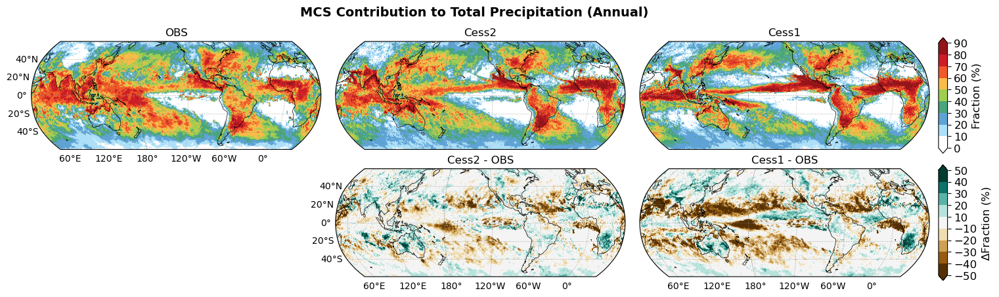

In [129]:
# Setup data arrays for plotting with 1 colorbar per row (2x3 grid)
# Row 1: MCS precipitation fraction, Row 2: Differences
data_arrays = [
    [mcs_pcpfrac_annual.sel(source='obs'), 
     mcs_pcpfrac_annual.sel(source='m2'), 
     mcs_pcpfrac_annual.sel(source='m1')],
    [None, 
     mcs_pcpfrac_annual.sel(source='m2') - mcs_pcpfrac_annual.sel(source='obs'),
     mcs_pcpfrac_annual.sel(source='m1') - mcs_pcpfrac_annual.sel(source='obs')],
]

# Setup titles
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m2']}", f"{name_map_plot['m1']}"],
    [None, f"{name_map_plot['m2']} - {name_map_plot['obs']}", f"{name_map_plot['m1']} - {name_map_plot['obs']}"],
]

# Setup grid parameters
nrow = len(data_arrays)
ncol = len(data_arrays[0])
figwidth = 18
height_ratio_per_panel = 0.4
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
wspace = 0.05
hspace = 0.1

# Setup colormap and levels (different per row)
varname = 'Fraction'
units = '%'
figtitle = 'MCS Contribution to Total Precipitation (Annual)'

# Row 1: Absolute values
lev1 = np.arange(0, 91, 10)
cmap1 = cmaps.WhiteBlueGreenYellowRed
cblabel1 = f'{varname} ({units})'

# Row 2: Differences
lev2 = [-50,-40,-30,-20,-10,10,20,30,40,50]
cmap2 = plt.get_cmap('BrBG')
cblabel2 = rf'$\Delta${varname} ({units})'

# Organize as lists (one per row)
levels = [lev1, lev2]
colormaps = [cmap1, cmap2]
cblabels = [cblabel1, cblabel2]
cbticks = [lev1, lev2]
oob_colors = [None, None]

figname = f'{figdir}maps_mcs_rainfrac_cess2vs1_obs_annual.png'

# Setup projection and latitude range
projection = ccrs.Robinson(central_longitude=225)
lat_range = (-60, 60)

# Configure gridline labels: show labels on leftmost column and bottom row
lon_label = [[True, False, False],  # Row 1: no lon labels
             [False, True, True]]    # Row 2: lon labels on last column only
lat_label = [[True, False, False],   # Row 1: lat labels on first column only
             [False, True, False]]   # Row 2: no lat labels

# Optional: Add terrain contours (e.g., at 1500m elevation)
terrain_levels = [1000]  # Set to None to disable terrain contours

# Plot figure with 1 colorbar per row
fig = plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, hp_lon, hp_lat,
                              projection=projection, lat_range=lat_range,
                              titles=titles, levels=levels, colormaps=colormaps, 
                              cblabels=cblabels, cbticks=cbticks,
                              min_thresh=None, oob_colors=oob_colors,
                              lon_label=lon_label, lat_label=lat_label,
                              wspace=wspace, hspace=hspace, figsize=figsize, fontsize=fontsize,
                              #   terrain_data=ter, terrain_levels=terrain_levels,          
                              figtitle=figtitle, figname=figname, dpi=200)

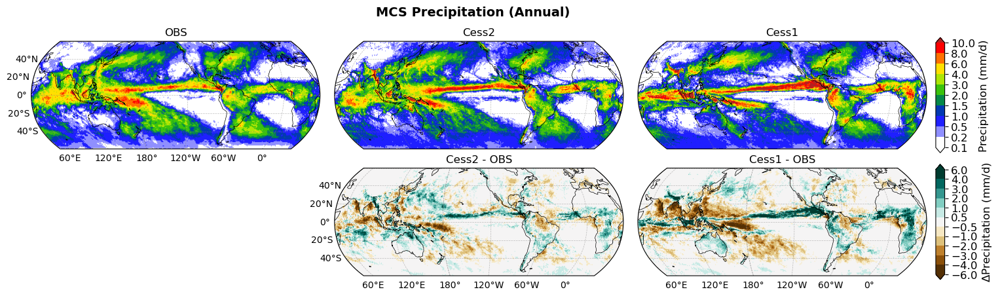

In [125]:
# Setup data arrays for plotting with 1 colorbar per row (2x3 grid)
# Row 1: MCS precipitation, Row 2: Differences
data_arrays = [
    [mcs_pcp_annual.sel(source='obs'), 
     mcs_pcp_annual.sel(source='m2'), 
     mcs_pcp_annual.sel(source='m1')],
    [None, 
     mcs_pcp_annual.sel(source='m2') - mcs_pcp_annual.sel(source='obs'),
     mcs_pcp_annual.sel(source='m1') - mcs_pcp_annual.sel(source='obs')],
]

# Setup titles
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m2']}", f"{name_map_plot['m1']}"],
    [None, f"{name_map_plot['m2']} - {name_map_plot['obs']}", f"{name_map_plot['m1']} - {name_map_plot['obs']}"],
]

# Setup colormap and levels (different per row)
varname = 'Precipitation'
units = 'mm/d'
figtitle = 'MCS Precipitation (Annual)'

# Row 1: Absolute values
lev1 = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
cmap1 = cmaps.WhBlGrYeRe
cblabel1 = f'{varname} ({units})'

# Row 2: Differences
lev2 = [-6,-4,-3,-2,-1,-0.5,0.5,1,2,3,4,6]
cmap2 = plt.get_cmap('BrBG')
cblabel2 = rf'$\Delta${varname} ({units})'

# Organize as lists (one per row)
levels = [lev1, lev2]
colormaps = [cmap1, cmap2]
cblabels = [cblabel1, cblabel2]
cbticks = [lev1, lev2]
oob_colors = [{'over':'firebrick','under':'white'}, None]

figname = f'{figdir}maps_mcs_rain_cess2vs1_obs_annual.png'

# Plot figure with 1 colorbar per row
fig = plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, hp_lon, hp_lat,
                              projection=projection, lat_range=lat_range,
                              titles=titles, levels=levels, colormaps=colormaps, 
                              cblabels=cblabels, cbticks=cbticks,
                              min_thresh=None, oob_colors=oob_colors,
                              lon_label=lon_label, lat_label=lat_label,
                              wspace=wspace, hspace=hspace, figsize=figsize, fontsize=fontsize,
                              figtitle=figtitle, figname=figname, dpi=200)

# This notebook demonstrates plotting seaonal mean MCS rain statistics on maps
## The monthly data is produced by: 
* /src/calc_tbpf_mcs_monthly_rainmap.py

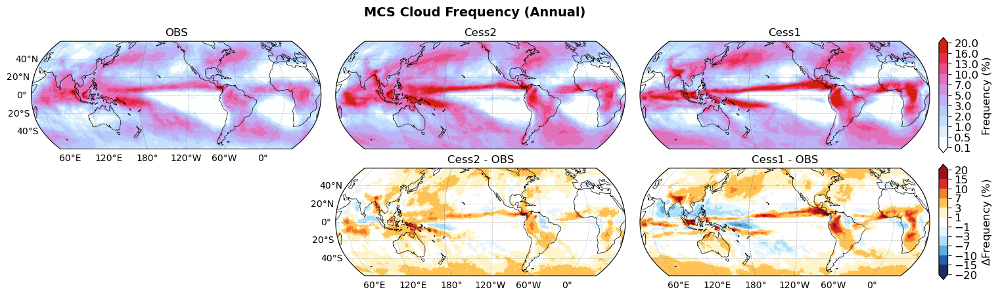

In [126]:
# Setup data arrays for plotting with 1 colorbar per row (2x3 grid)
# Row 1: MCS cloud frequency, Row 2: Differences
data_arrays = [
    [mcs_cloudfreq_annual.sel(source='obs'), 
     mcs_cloudfreq_annual.sel(source='m2'), 
     mcs_cloudfreq_annual.sel(source='m1')],
    [None, 
     mcs_cloudfreq_annual.sel(source='m2') - mcs_cloudfreq_annual.sel(source='obs'),
     mcs_cloudfreq_annual.sel(source='m1') - mcs_cloudfreq_annual.sel(source='obs')],
]

# Setup titles
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m2']}", f"{name_map_plot['m1']}"],
    [None, f"{name_map_plot['m2']} - {name_map_plot['obs']}", f"{name_map_plot['m1']} - {name_map_plot['obs']}"],
]

# Setup colormap and levels (different per row)
varname = 'Frequency'
units = '%'
figtitle = 'MCS Cloud Frequency (Annual)'

# Row 1: Absolute values
lev1 = [0.1,0.5,1,2,3,5,7,10,13,16,20]
cmap1 = cmaps.cet_l_wcmr
cblabel1 = f'{varname} ({units})'

# Row 2: Differences
lev2 = [-20,-15,-10,-7,-3,-1,1,3,7,10,15,20]
cmap2 = cmaps.BlueWhiteOrangeRed
cblabel2 = rf'$\Delta${varname} ({units})'

# Organize as lists (one per row)
levels = [lev1, lev2]
colormaps = [cmap1, cmap2]
cblabels = [cblabel1, cblabel2]
cbticks = [lev1, lev2]
oob_colors = [None, None]

figname = f'{figdir}maps_mcs_cloudfreq_cess2vs1_obs_annual.png'

# Plot figure with 1 colorbar per row
fig = plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, hp_lon, hp_lat,
                              projection=projection, lat_range=lat_range,
                              titles=titles, levels=levels, colormaps=colormaps, 
                              cblabels=cblabels, cbticks=cbticks,
                              min_thresh=None, oob_colors=oob_colors,
                              lon_label=lon_label, lat_label=lat_label,
                              wspace=wspace, hspace=hspace, figsize=figsize, fontsize=fontsize,
                              figtitle=figtitle, figname=figname, dpi=200)

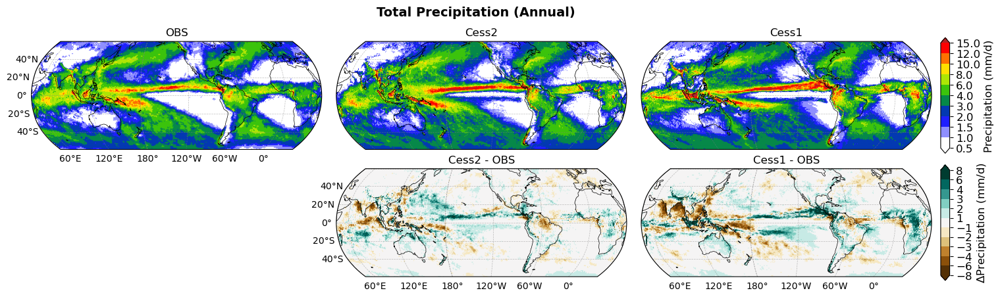

In [127]:
# Setup data arrays for plotting with 1 colorbar per row (2x3 grid)
# Row 1: MCS precipitation, Row 2: Differences
data_arrays = [
    [tot_pcp_annual.sel(source='obs'), 
     tot_pcp_annual.sel(source='m2'), 
     tot_pcp_annual.sel(source='m1')],
    [None, 
     tot_pcp_annual.sel(source='m2') - tot_pcp_annual.sel(source='obs'),
     tot_pcp_annual.sel(source='m1') - tot_pcp_annual.sel(source='obs')],
]

# Setup titles
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m2']}", f"{name_map_plot['m1']}"],
    [None, f"{name_map_plot['m2']} - {name_map_plot['obs']}", f"{name_map_plot['m1']} - {name_map_plot['obs']}"],
]

# Setup colormap and levels (different per row)
varname = 'Precipitation'
units = 'mm/d'
figtitle = 'Total Precipitation (Annual)'

# Row 1: Absolute values
lev1 = [0.5,1,1.5,2,3,4,6,8,10,12,15]
cmap1 = cmaps.WhBlGrYeRe
cblabel1 = f'{varname} ({units})'

# Row 2: Differences
lev2 = [-8,-6,-4,-3,-2,-1,1,2,3,4,6,8]
cmap2 = plt.get_cmap('BrBG')
cblabel2 = rf'$\Delta${varname} ({units})'

# Organize as lists (one per row)
levels = [lev1, lev2]
colormaps = [cmap1, cmap2]
cblabels = [cblabel1, cblabel2]
cbticks = [lev1, lev2]
oob_colors = [{'over':'firebrick','under':'white'}, None]

figname = f'{figdir}maps_total_rain_cess2vs1_obs_annual.png'

# Plot figure with 1 colorbar per row
fig = plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, hp_lon, hp_lat,
                              projection=projection, lat_range=lat_range,
                              titles=titles, levels=levels, colormaps=colormaps, 
                              cblabels=cblabels, cbticks=cbticks,
                              min_thresh=None, oob_colors=oob_colors,
                              lon_label=lon_label, lat_label=lat_label,
                              wspace=wspace, hspace=hspace, figsize=figsize, fontsize=fontsize,
                              figtitle=figtitle, figname=figname, dpi=200)

## Seasonal mean plots

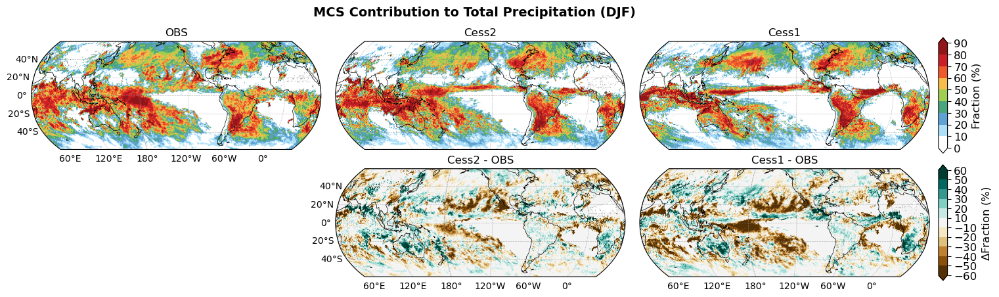

Completed: mcs_pcpfrac for DJF


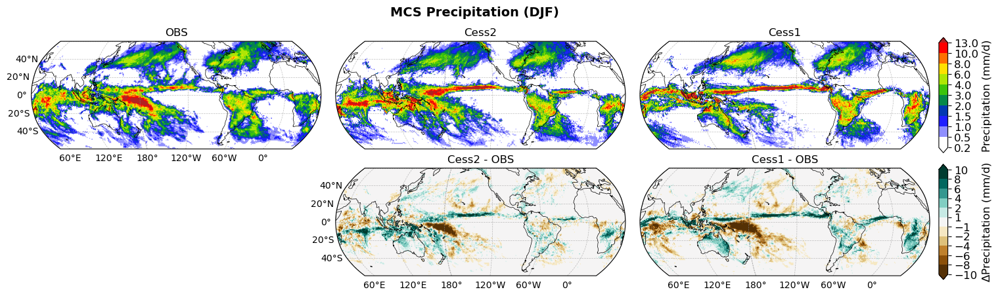

Completed: mcs_pcp for DJF


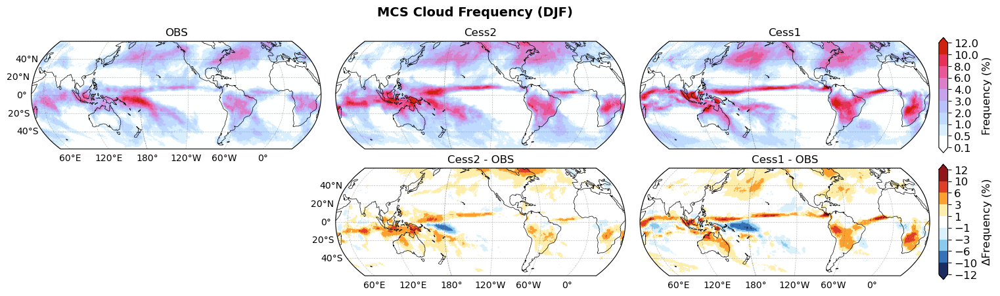

Completed: mcs_cloudfreq for DJF


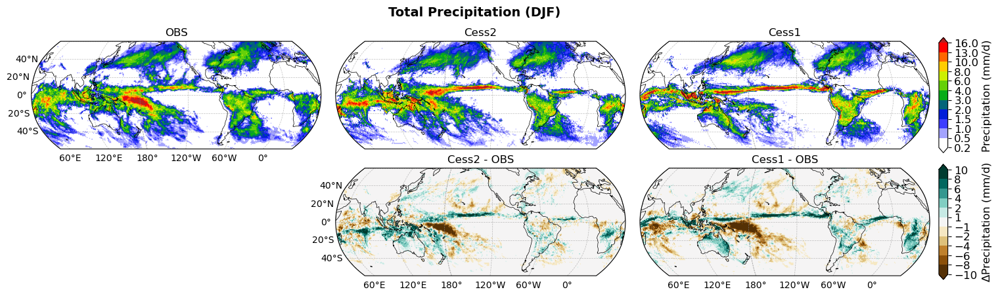

Completed: tot_pcp for DJF


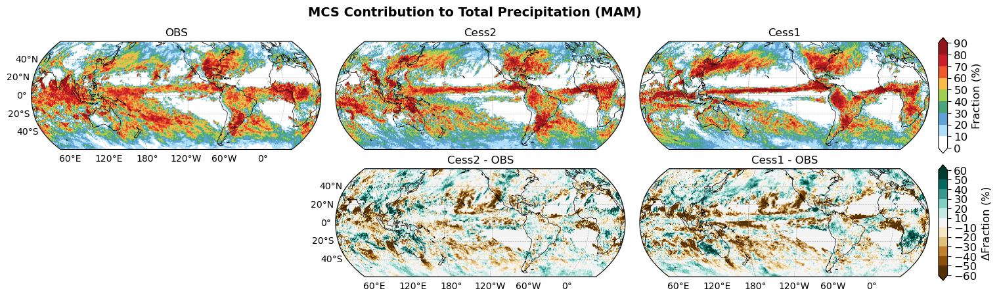

Completed: mcs_pcpfrac for MAM


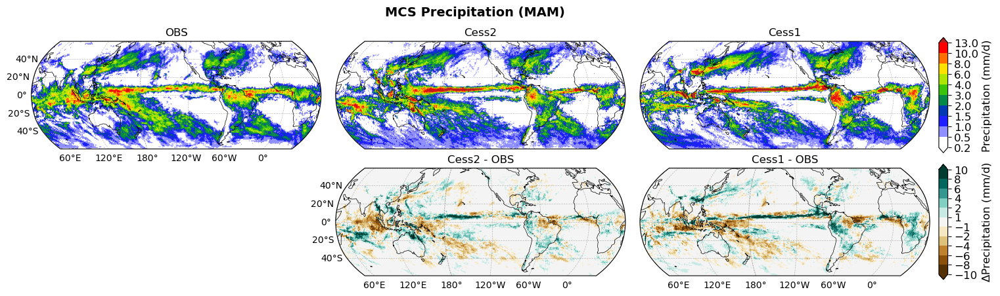

Completed: mcs_pcp for MAM


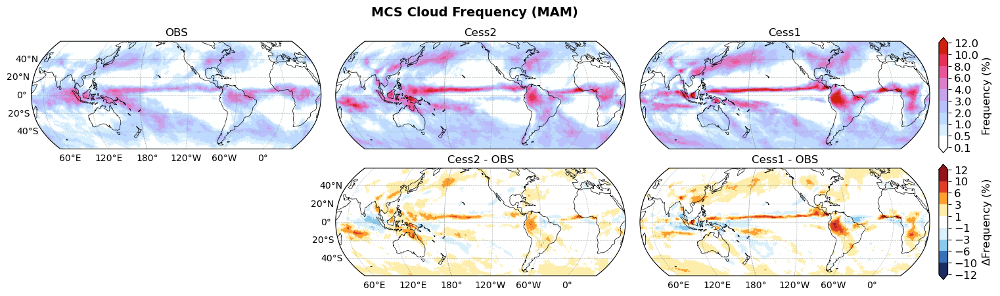

Completed: mcs_cloudfreq for MAM


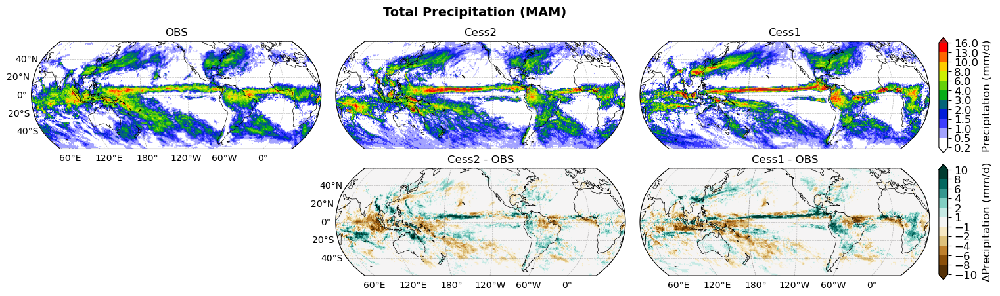

Completed: tot_pcp for MAM


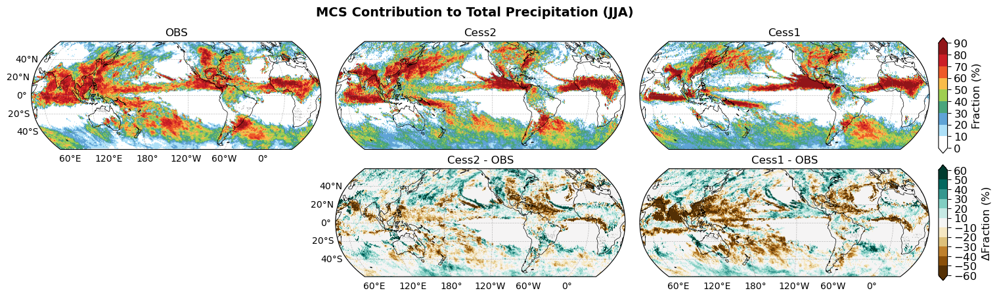

Completed: mcs_pcpfrac for JJA


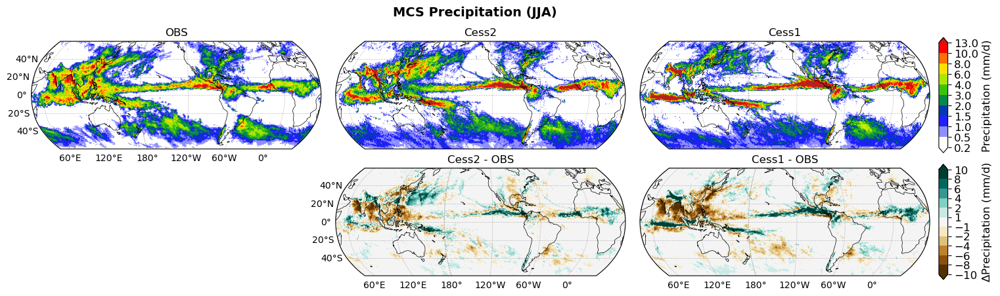

Completed: mcs_pcp for JJA


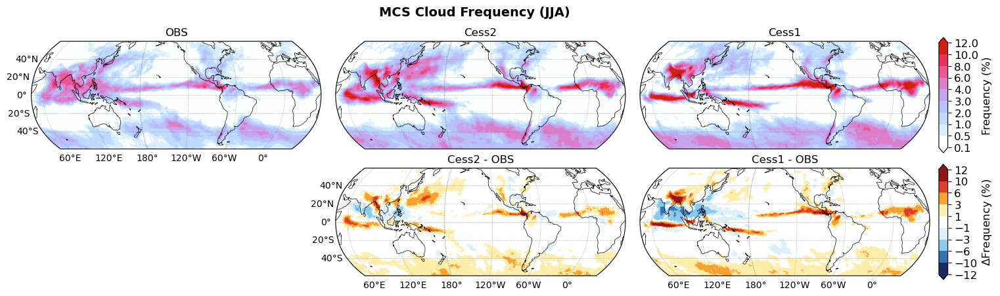

Completed: mcs_cloudfreq for JJA


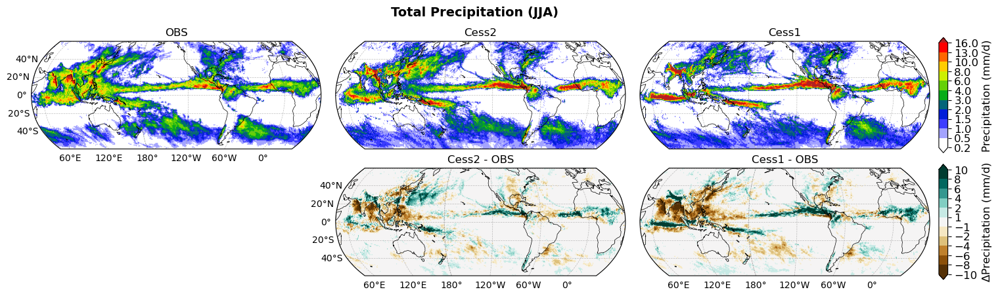

Completed: tot_pcp for JJA


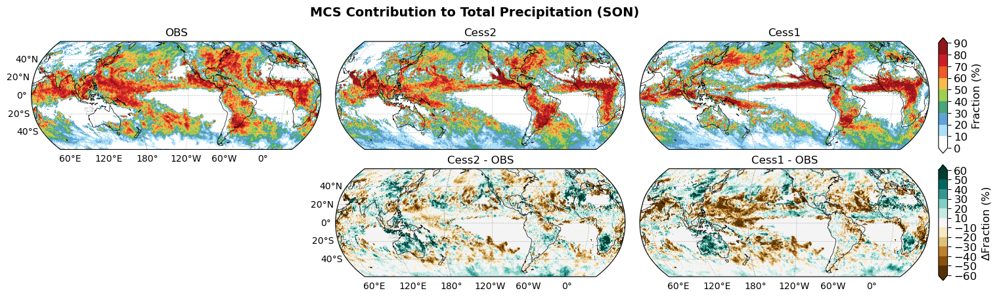

Completed: mcs_pcpfrac for SON


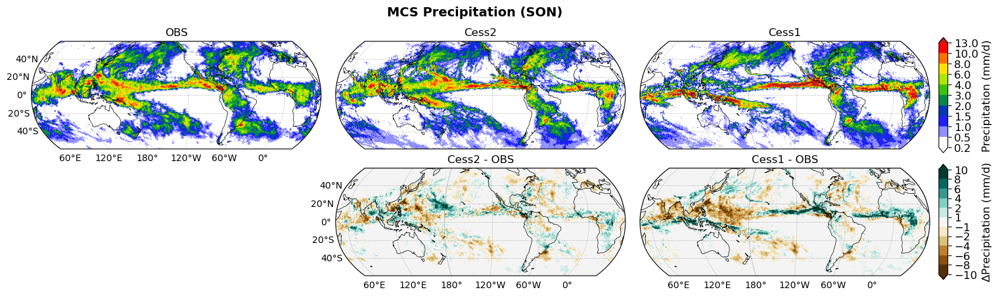

Completed: mcs_pcp for SON


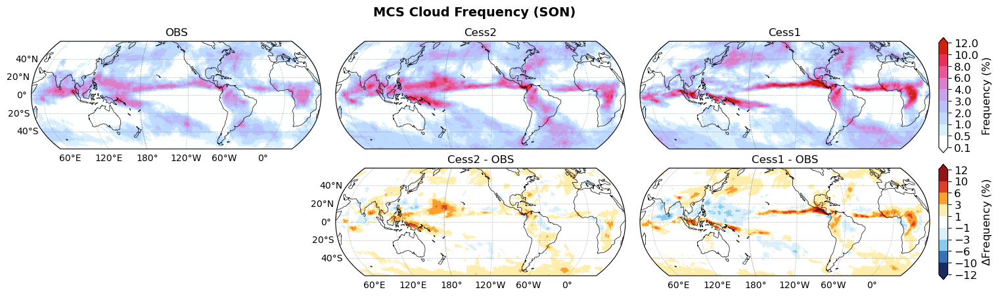

Completed: mcs_cloudfreq for SON


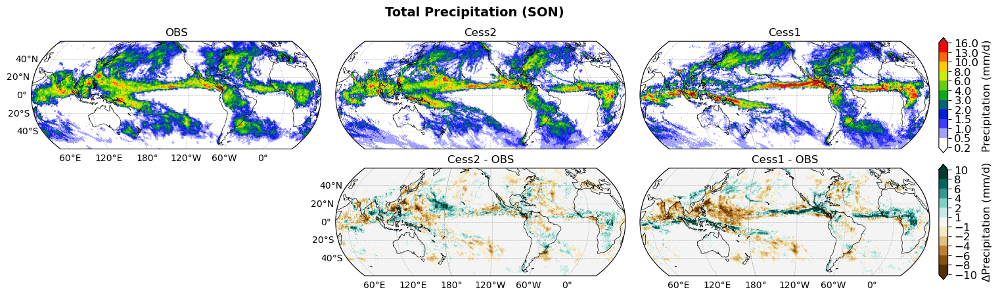

Completed: tot_pcp for SON


In [128]:
# Define seasons to plot
seasons = ['DJF', 'MAM', 'JJA', 'SON']
# seasons = ['JJA']

# Define variables to plot with their parameters
variables_config = {
    'mcs_pcpfrac': {
        'data': mcs_pcpfrac_season,
        'varname': 'Fraction',
        'units': '%',
        'title': 'MCS Contribution to Total Precipitation',
        'lev1': np.arange(0, 91, 10),
        'lev2': [-60,-50,-40,-30,-20,-10,10,20,30,40,50,60],
        'cmap1': cmaps.WhiteBlueGreenYellowRed,
        'cmap2': plt.get_cmap('BrBG'),
        'oob_colors': [None, None],
        'figprefix': 'maps_mcs_rainfrac_cess2vs1_obs'
    },
    'mcs_pcp': {
        'data': mcs_pcp_season,
        'varname': 'Precipitation',
        'units': 'mm/d',
        'title': 'MCS Precipitation',
        'lev1': [0.2, 0.5, 1, 1.5, 2, 3, 4, 6, 8, 10, 13],
        'lev2': [-10, -8, -6, -4, -2, -1, 1, 2, 4, 6, 8, 10],
        'cmap1': cmaps.WhBlGrYeRe,
        'cmap2': plt.get_cmap('BrBG'),
        'oob_colors': [{'over': 'firebrick', 'under': 'white'}, None],
        'figprefix': 'maps_mcs_rain_cess2vs1_obs'
    },
    'mcs_cloudfreq': {
        'data': mcs_cloudfreq_season,
        'varname': 'Frequency',
        'units': '%',
        'title': 'MCS Cloud Frequency',
        'lev1': [0.1, 0.5, 1, 2, 3, 4, 6, 8, 10, 12],
        'lev2': [-12, -10, -6, -3, -1, 1, 3, 6, 10, 12],
        'cmap1': cmaps.cet_l_wcmr,
        'cmap2': cmaps.BlueWhiteOrangeRed,
        'oob_colors': [None, None],
        'figprefix': 'maps_mcs_cloudfreq_cess2vs1_obs'
    },
    'tot_pcp': {
        'data': mcs_pcp_season,
        'varname': 'Precipitation',
        'units': 'mm/d',
        'title': 'Total Precipitation',
        'lev1': [0.2, 0.5, 1, 1.5, 2, 3, 4, 6, 8, 10, 13, 16],
        'lev2': [-10, -8, -6, -4, -2, -1, 1, 2, 4, 6, 8, 10],
        'cmap1': cmaps.WhBlGrYeRe,
        'cmap2': plt.get_cmap('BrBG'),
        'oob_colors': [{'over': 'firebrick', 'under': 'white'}, None],
        'figprefix': 'maps_total_rain_cess2vs1_obs'
    },
}

# Common grid parameters
nrow = 2
ncol = 3
figwidth = 18
height_ratio_per_panel = 0.4
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
wspace = 0.05
hspace = 0.1

# Setup projection and latitude range
projection = ccrs.Robinson(central_longitude=225)
lat_range = (-60, 60)

# Configure gridline labels
lon_label = [[True, False, False],
             [False, True, True]]
lat_label = [[True, False, False],
             [False, True, False]]

# Setup titles (common structure)
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m2']}", f"{name_map_plot['m1']}"],
    [None, f"{name_map_plot['m2']} - {name_map_plot['obs']}", f"{name_map_plot['m1']} - {name_map_plot['obs']}"],
]

# Loop through seasons and variables
for season in seasons:
    for var_key, var_config in variables_config.items():
        
        # Get seasonal data
        data_season = var_config['data']
        
        # Setup data arrays for plotting (2x3 grid)
        data_arrays = [
            [data_season.sel(source='obs', season=season),
             data_season.sel(source='m2', season=season),
             data_season.sel(source='m1', season=season)],
            [None,
             data_season.sel(source='m2', season=season) - data_season.sel(source='obs', season=season),
             data_season.sel(source='m1', season=season) - data_season.sel(source='obs', season=season)],
        ]
        
        # Setup colormap and levels
        varname = var_config['varname']
        units = var_config['units']
        figtitle = f"{var_config['title']} ({season})"
        
        lev1 = var_config['lev1']
        lev2 = var_config['lev2']
        cmap1 = var_config['cmap1']
        cmap2 = var_config['cmap2']
        oob_colors = var_config['oob_colors']
        
        cblabel1 = f'{varname} ({units})'
        cblabel2 = rf'$\Delta${varname} ({units})'
        
        # Organize as lists (one per row)
        levels = [lev1, lev2]
        colormaps = [cmap1, cmap2]
        cblabels = [cblabel1, cblabel2]
        cbticks = [lev1, lev2]        
        
        figname = f"{figdir}{var_config['figprefix']}_{season.upper()}.png"
        
        # Plot figure with 1 colorbar per row
        fig = plot_nxm_maps_1colorbar(nrow, ncol, data_arrays, hp_lon, hp_lat,
                                      projection=projection, lat_range=lat_range,
                                      titles=titles, levels=levels, colormaps=colormaps,
                                      cblabels=cblabels, cbticks=cbticks,
                                      min_thresh=None, oob_colors=oob_colors,
                                      lon_label=lon_label, lat_label=lat_label,
                                      wspace=wspace, hspace=hspace, figsize=figsize, fontsize=fontsize,
                                      figtitle=figtitle, figname=figname, dpi=200)
        
        plt.show()
        print(f'Completed: {var_key} for {season}')
